In [1]:
import multiprocessing as mp
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from utils.generate_bg import generate_rand_bg, get_flat_background

In [3]:
h_size = 256
w_size = 256
bg_pool_size = 1000
cores_count = mp.cpu_count()
max_bright = h_size * w_size * 3 * 255.0

In [4]:
%%time
def get_batch_bg_bright(batch_size):
    return [
        generate_rand_bg(h_size, w_size)
        for _ in range(batch_size)
    ]

noise_bg = []
with mp.Pool(processes=cores_count) as pool:
    multiple_results = [
        pool.apply_async(
            get_batch_bg_bright, 
            args=(bg_pool_size // cores_count,)
        ) 
        for _ in range(cores_count)
    ]
    for res in multiple_results:
        noise_bg += res.get()

CPU times: user 137 ms, sys: 307 ms, total: 444 ms
Wall time: 15.2 s


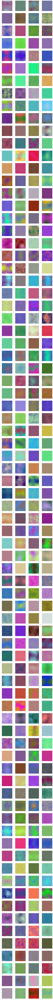

In [5]:
rows = 80
cols = 4
fig, axes = plt.subplots(rows, cols, figsize=(4*cols,4*rows))
for i in range(rows):
    for j in range(cols):
        axes[i, j].set_axis_off()
        axes[i, j].imshow(noise_bg[i * cols + j]);